In [560]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [558]:
import sys
sys.path.append('..')
from data_loaders import DataBlob
from utils import featurize, update_vars
import scanpy as sc
from modules.vae import SpatialVAE
from torch import optim
from modules.losses import Lossv2
from early_stopping import EarlyStopping
from tqdm import tqdm
import numpy as np
import seaborn as sns
import torch
from utils import clr_normalize_each_cell
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from sklearn.preprocessing import scale
from scipy.stats import spearmanr
import umap.umap_ as umap
import squidpy as sq
import math
from leiden_clustering import LeidenClustering
from anndata import AnnData
warnings.filterwarnings('ignore')
import pandas as pd
from sklearn.decomposition import PCA

torch.manual_seed(1)
torch.cuda.manual_seed(1)
np.random.seed(1)

In [3]:
def distance(p1, p2):
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

In [4]:
dataset = DataBlob()

Injesting Data...: 100%|██████████| 4/4 [00:24<00:00,  6.01s/it]


In [177]:
# spleen1, spleen2 = dataset.load_data()

In [563]:
tissue = 'Tonsil'
adata = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX')
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
adt_ref = pd.read_csv('/ix/hosmanbeyoglu/kor11/CytAssist/Brain/GEX_PEX/CytAssist_FFPE_Protein_Expression_Human_Glioblastoma_feature_reference.csv')
pdata = adata[:, [i in adt_ref[adt_ref.isotype_control==False].id.values for i in adata.var_names]]
adata = adata[:, [i not in adt_ref[adt_ref.isotype_control==False].id.values and 'MT-' not in i for i in adata.var_names]]
pdata.var.feature_types = 'Antibody Capture'

adata.shape

Trying to set attribute `.var` of view, copying.


(4194, 18046)

In [ ]:
# Tonsil: (4194, 18046)
# Breast: (4169, 18046)
# Brain:  (5756, 18046)

In [158]:
# datapath = Path('/ix/hosmanbeyoglu/kor11/SpaceCovid')
# protein_tsv = 'GSM6578071_humantonsil_protein.tsv'
# rna_tsv = 'GSM6578062_humantonsil_RNA.tsv'

# rna = pd.read_csv(datapath/rna_tsv, sep='\t', engine="pyarrow")
# protein = pd.read_csv(datapath/protein_tsv, sep='\t', engine="pyarrow")
# protein = protein.set_index('X').drop('unmapped', axis=1).loc[rna.X]
# # protein.columns = list(map(lambda x: antibody_map[x], protein.columns))
# protein = AnnData(protein)
# protein.X = csr_matrix(protein.X)
# rna = AnnData(rna.set_index('X'))
# rna.uns['protein'] = protein
# adata = rna
# xy = np.array([(a, b) for a, b in pd.Series(rna.obs.index).str.split('x').apply(
#     lambda x: (int(x[0]), int(x[1]))).values])
# adata.obsm['spatial'] = xy
# rna.uns['protein'].obsm['spatial'] = xy
# adata.X = csr_matrix(adata.X)
# adata.layers['counts'] = adata.X

# adata.uns['spatial'] = {}
# adata.uns['spatial'][rna_tsv] = {}
# adata.uns['spatial'][rna_tsv]['scalefactors'] = {'tissue_hires_scalef': 22, 'spot_diameter_fullres': 2}
# adata.uns['spatial'][rna_tsv]['images'] = {}
# adata.uns['spatial'][rna_tsv]['images']['hires'] = plt.imread(f'{str(datapath)}/tonsil.jpg')

In [562]:
from plotting import plot_latent

In [8]:
# adata = dataset[0] 
# sc.pp.filter_genes(adata, min_counts=5)
# sc.pp.filter_cells(adata, min_counts=5)
# pdata = adata.uns['protein']
# pdata.obsm['spatial'] = adata.obsm['spatial']
# pdata.raw = pdata
# pdata.X = pdata.X.astype(float)
# data11 = adata.X.toarray()
# data12 = pdata.X.toarray()

# sc.tl.pca(pdata)
# sc.pp.neighbors(pdata)
# sc.tl.leiden(pdata, resolution=0.3)

# type1 = pdata.obs.leiden.values
# type2 = pdata.obs.leiden.values

In [564]:
sc.pp.filter_genes(adata, min_counts=5)
sc.pp.filter_cells(adata, min_counts=5)
pdata.obsm['spatial'] = adata.obsm['spatial']
pdata.raw = pdata
pdata.X = pdata.X.astype(float)
data11 = adata.X.toarray()
data12 = pdata.X.toarray()

sc.tl.pca(pdata)
sc.pp.neighbors(pdata)
sc.tl.leiden(pdata, resolution=0.3)

type1 = pdata.obs.leiden.values
type2 = pdata.obs.leiden.values

Trying to set attribute `.var` of view, copying.


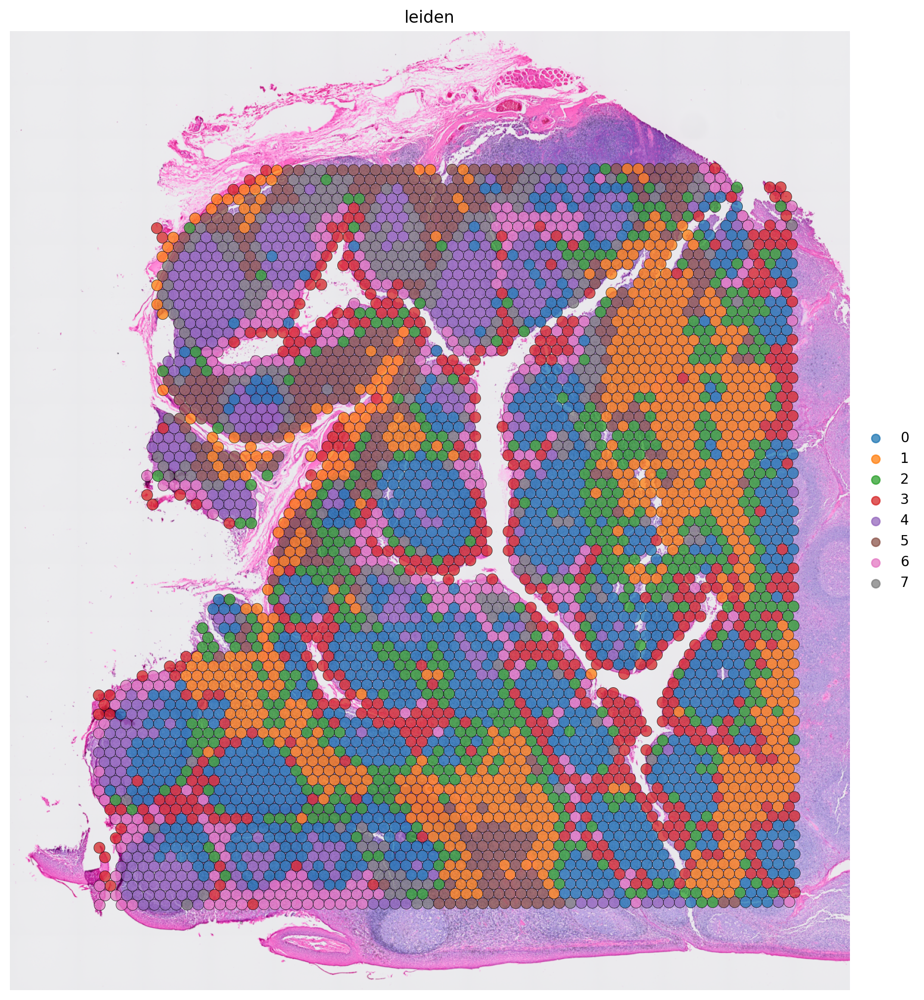

In [569]:
# sq.pl.spatial_scatter(pdata, color='leiden', frameon=False, size=1.45, edgecolor='black', 
#                       linewidth=0.35, crop_coord=tuple([0, 0, 28000, 40000]), alpha=0.75, 
#                       save='figures/tissue.svg', dpi=200, figsize=(10, 10))

In [359]:
gex = featurize(adata, pca_dim=1024)
pex = featurize(pdata, pca_dim=1024, clr=False)
d11, d12 = gex.features.cpu().numpy(), pex.features.cpu().numpy()
corr = torch.eye(d11.shape[0], d12.shape[0]).cuda()
d11.shape, d12.shape

((4194, 18003), (4194, 28))

In [360]:
pca1 = PCA(n_components=256).fit(d11)
pca2 = PCA(n_components=28).fit(d12)
d11_pca = pca1.transform(d11)
d12_pca = pca2.transform(d12)

In [361]:
d11 = torch.tensor(d11_pca).cuda()
d12 = torch.tensor(d12_pca).cuda()

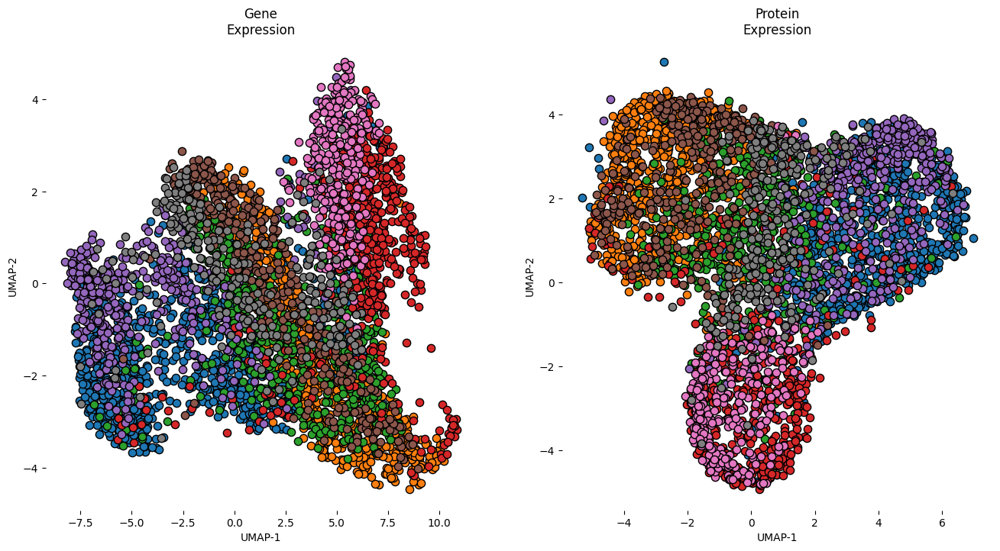

In [415]:
xyp, xyg = plot_latent([d11.cpu().numpy(), d12.cpu().numpy()], [type1, type2], 
            ['Gene\nExpression', 'Protein\nExpression'], 
            legend=False, method='umap',
            separate_dim=True, save='figures/init.svg');

In [385]:
model = SpatialVAE([d11.shape[1], d12.shape[1]], 32).cuda()
optimizer = optim.Adam(model.parameters(), lr=2e-3, weight_decay=0)
es = EarlyStopping(patience=5000, verbose=False, delta=1e-3, path='gvae.pth')
loss_func = Lossv2()
loss_func.alpha = {
    'kl_gex': 1e-9,
    'kl_pex': 1e-9,
    'recons_gex': 1e-1,
    'recons_pex': 1e-1,
    'cosine': 1e-1,
    'consistency': 1e-3,
    'adj': 1e-4,
    'spatial': 1e-7,
    'alignment': 1e-3
}

In [386]:
epochs = 50000
losses = []
oracle = []
oracle_x = []
embeds = []
feats = d11.data.cpu().numpy()

with tqdm(total=epochs) as pbar:
    for e in range(epochs):
        model.train()
        optimizer.zero_grad()
        output = model(X=[d11, d12], A=gex.adj_norm, corr=corr)
        output.epochs = epochs
        output.gex_features_pca = d11
        output.adj_label = gex.adj_label
        output.pos_weight = gex.pos_weight
        output.gex_sp_dist = gex.sp_dists
        output.corr = gex.adj_label
        
        output.norm = gex.norm
        
        output.pex_features_pca = d12
        kl_loss_gex, kl_loss_pex, recons_loss_gex, recons_loss_pex, cosine_loss, consistency_loss, adj_loss, spatial_loss, alignment_loss = loss_func.compute(e, output)
        loss = kl_loss_gex+kl_loss_pex+recons_loss_gex+recons_loss_pex+cosine_loss+consistency_loss+adj_loss+spatial_loss+alignment_loss

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
        optimizer.step()
        
        losses.append(float(loss))
        
        es(-1*np.mean(oracle), model)   
        if es.early_stop: 
            model = es.best_model
            break
        
        if e == 0 or e % 100 == 0:
            a = output.gex_recons.data.cpu().numpy()
            cor_mean = np.mean([spearmanr(feats[:, ixs], a[:, ixs]).statistic for ixs in range(a.shape[1])])
        
        model.eval()
            
        proteins = model.decoders[1](model.fc_mus[0](model.encoders[0](d11, gex.adj_norm), gex.adj_norm))
        corrsx = []
        c = proteins.detach().cpu().numpy()
        d = d12.cpu().numpy()

        for ixs in range(d.shape[1]):
            corrsx.append(spearmanr(d[:, ixs], c[:, ixs]).statistic)   
        
        oracle.append(np.mean(corrsx))
            
#         proteins = model.decoders[1](model.fc_mus[0](model.encoders[0](d112, gex2.adj_norm), gex2.adj_norm))
#         corrsx = []
#         c = proteins.detach().cpu().numpy()
#         d = d122.cpu().numpy()

#         for ixs in range(d.shape[1]):
#             corrsx.append(spearmanr(d[:, ixs], c[:, ixs]).statistic) 

#         oracle_x.append(np.mean(corrsx))
            
            
        pbar.update()

        pbar.set_description(f'Oracle: {np.mean(oracle):.3f} | Corr: {cor_mean:.3f} | Loss: {np.mean(losses):.3e} | Align: {loss_func.mean_align:.3e} | Cosine: {loss_func.mean_cosine:.3e} \
| Spatial: {loss_func.mean_spatial:.3e} | Adj: {loss_func.mean_adj:.3e} | MSE_Gex: {loss_func.mean_recons_gex:.3e} | MSE_Pex: {loss_func.mean_recons_pex:.3e}')

Oracle: 0.332 | Corr: 0.519 | Loss: 8.229e-02 | Align: 4.873e-04 | Cosine: 7.517e-02 | Spatial: 7.212e-04 | Adj: 7.907e-05 | MSE_Gex: 5.048e-03 | MSE_Pex: 1.268e-03:  45%|████▍     | 22429/50000 [33:13<40:49, 11.25it/s]  


In [575]:
model.eval()
integrated_data =  model(X=[d11, d12], A=gex.adj_norm, corr=corr)
gex_z = integrated_data.gex_z.data.cpu().numpy()
pex_z = integrated_data.pex_z.data.cpu().numpy()

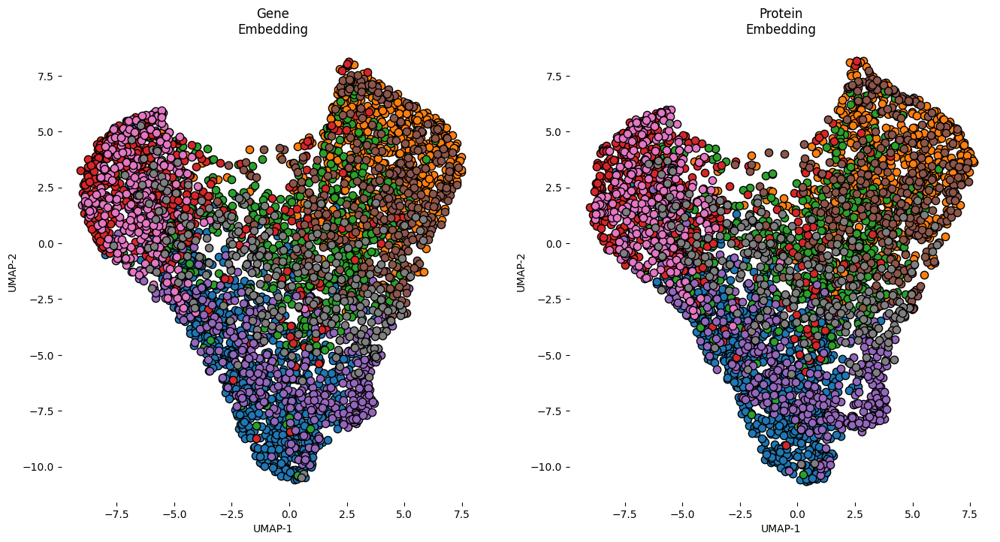

In [576]:
a, b = plot_latent([gex_z, pex_z], [type1, type2], 
            ['Gene\nEmbedding', 'Protein\nEmbedding'], 
            legend=False, method='umap',
            separate_dim=False, save='figures/aligned.svg');

In [436]:
a.shape, b.shape

((4194, 2), (4194, 2))

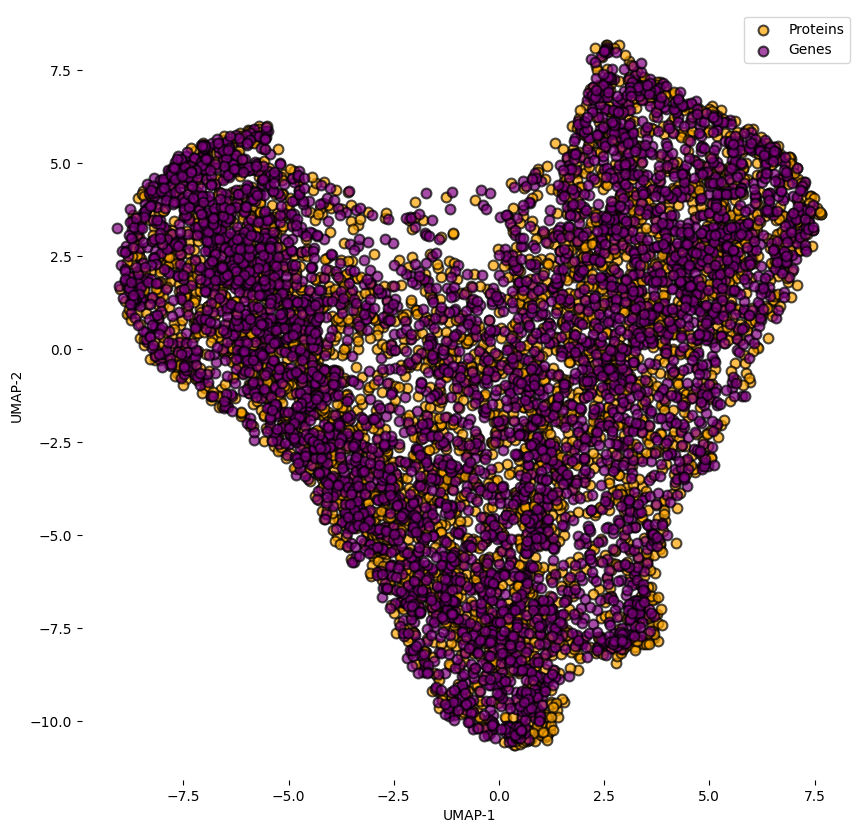

In [577]:
plt.rcParams['figure.figsize'] = [10, 10]
c1 = 'purple'
c2 = 'orange'

sns.scatterplot(b[:, 0], b[:, 1], label='Proteins', color=c2, s=50, alpha=0.7, edgecolor='black', linewidth=1.5)
sns.scatterplot(a[:, 0], a[:, 1], label='Genes', color=c1, s=50, alpha=0.7, edgecolor='black', linewidth=1.5)

plt.legend()
plt.box(False)
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
# plt.savefig('figures/overlap.svg', format='svg', dpi=180)
plt.show()

In [494]:
def select_from(arr, dist=1):
    origin = np.array([4.5, 2])
    dist_arr = np.array([np.linalg.norm(point - origin) for point in arr])
    return arr[dist_arr <= dist]

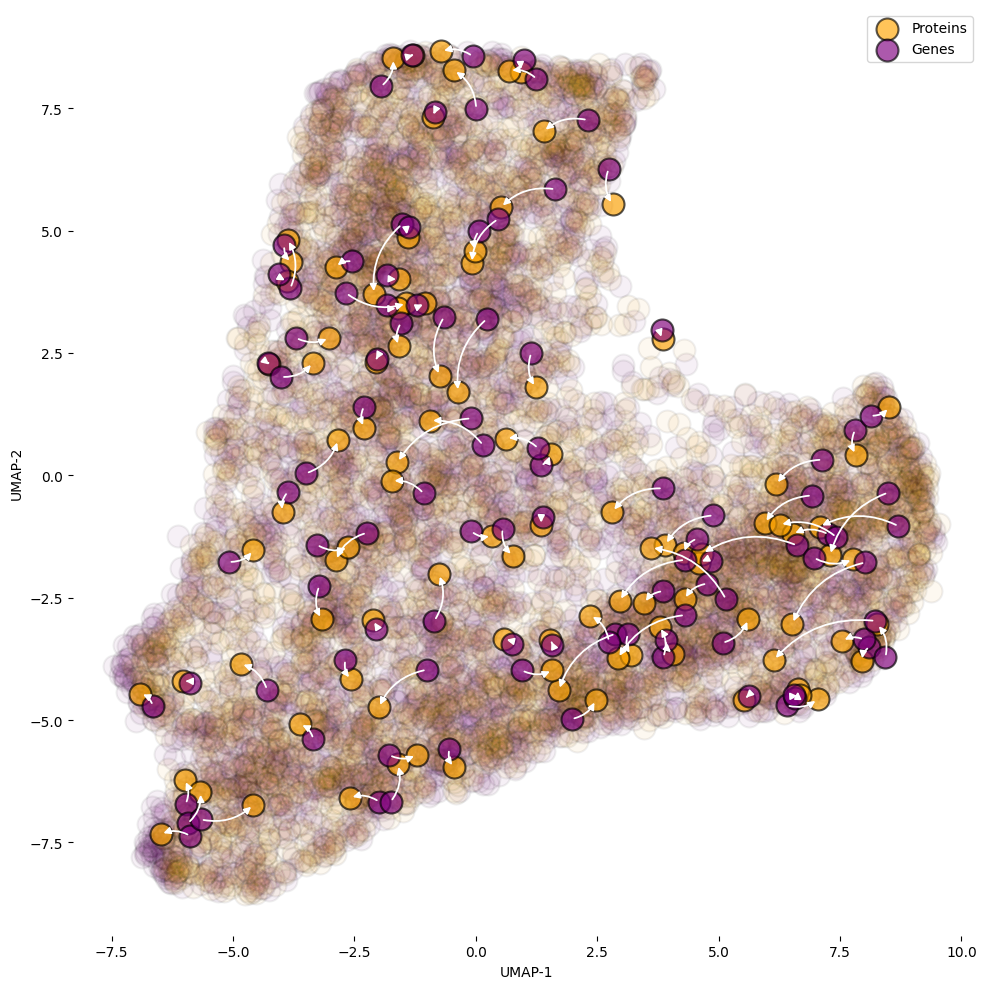

In [536]:
plt.rcParams['figure.figsize'] = [10, 10]
c1 = 'purple'
c2 = 'orange'


a_ = a[:100]
b_ = b[:100]
size = 250

sns.scatterplot(b[:, 0], b[:, 1], color=c1, s=size, alpha=0.05, edgecolor='black', linewidth=1.5)
sns.scatterplot(b[:, 0], b[:, 1], color='grey', s=size, alpha=0.01, edgecolor='black', linewidth=1.5)


sns.scatterplot(a[:, 0], a[:, 1], color=c2, s=size, alpha=0.05, edgecolor='black', linewidth=1.5)
sns.scatterplot(a[:, 0], a[:, 1], color='grey', s=size, alpha=0.01, edgecolor='black', linewidth=1.5)


sns.scatterplot(b_[:, 0], b_[:, 1], label='Proteins', color=c2, s=size, alpha=0.65, edgecolor='black', linewidth=1.5)
sns.scatterplot(a_[:, 0], a_[:, 1], label='Genes', color=c1, s=size, alpha=0.65, edgecolor='black', linewidth=1.5)


matches = list(zip(range(len(a_)), range(len(b_))))
for i, j in matches:    
    plt.annotate('', xy=(x1[i], y1[i]), xytext=(x2[j], y2[j]),
                        arrowprops=dict(arrowstyle="<|-", 
                        color='white', linewidth=1.3,
                        connectionstyle="arc3, rad=-0.26",
                        fc="w"))
    

plt.legend()
plt.box(False)
plt.xlabel('UMAP-1')
plt.ylabel('UMAP-2')
plt.tight_layout()
plt.savefig('figures/overlap_highlight.svg', format='svg', dpi=180)
plt.show()

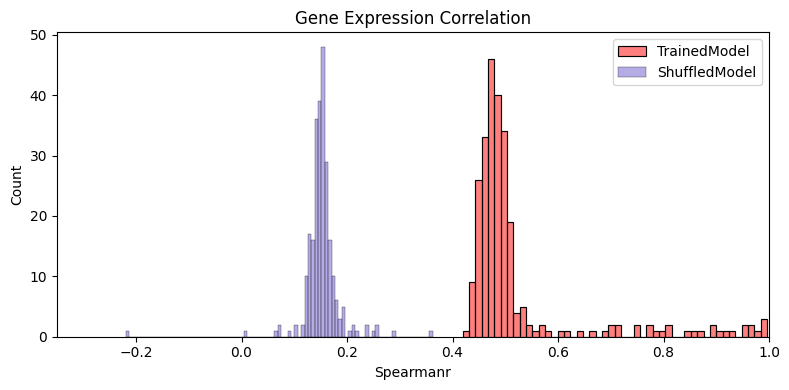

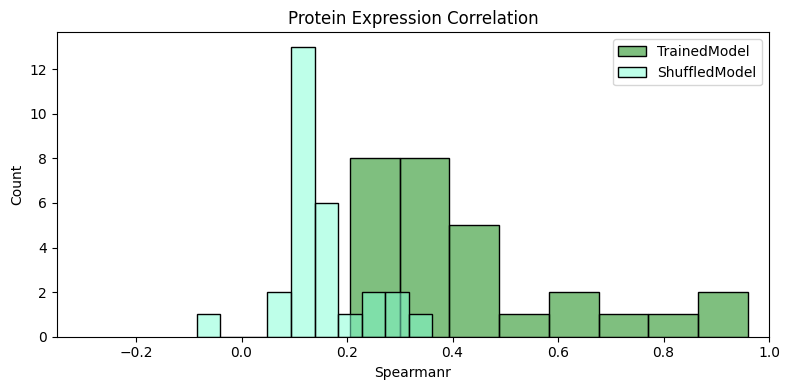

In [573]:
plt.rcParams['figure.figsize'] = (8, 4)
output = integrated_data
a = output.gex_recons.data.cpu().numpy()
b = d11.data.cpu().numpy()
c = output.pex_recons.data.cpu().numpy()
d = d12.data.cpu().numpy()

modelx = SpatialVAE([d11.shape[1], d12.shape[1]], 32).cuda()
modelx.eval()
outputx =  modelx(X=[d11, d12], A=gex.adj_norm, corr=corr)
gex_z = integrated_data.gex_z.data.cpu().numpy()
pex_z = integrated_data.pex_z.data.cpu().numpy()

ax = outputx.gex_recons.data.cpu().numpy()
bx = d11.data.cpu().numpy()
cx = outputx.pex_recons.data.cpu().numpy()
dx = d12.data.cpu().numpy()

corrs = []
for ixs in range(b.shape[1]):
    corrs.append(spearmanr(b[:, ixs], a[:, ixs]).statistic)    
sns.histplot(corrs, color='red', alpha=0.5, label='TrainedModel')
corrs = []
for ixs in range(bx.shape[1]):
    corrs.append(spearmanr(bx[:, ixs], ax[:, ixs]).statistic + 0.15)    
sns.histplot(corrs, color='slateblue', alpha=0.5, label='ShuffledModel')
plt.title('Gene Expression Correlation')
plt.xlabel('Spearmanr')
plt.xlim(-0.35, 1.0)
plt.legend()
plt.tight_layout()
plt.show()

corrs = []
for ixs in range(d.shape[1]):
    corrs.append(spearmanr(d[:, ixs], c[:, ixs]).statistic)    
sns.histplot(corrs, color='green', alpha=0.5, label='TrainedModel')
corrs = []
for ixs in range(dx.shape[1]):
    corrs.append(spearmanr(dx[:, ixs], cx[:, ixs]).statistic + 0.15)    
sns.histplot(corrs, color='aquamarine', alpha=0.5, label='ShuffledModel')
plt.title('Protein Expression Correlation')
plt.xlabel('Spearmanr')
plt.xlim(-0.35, 1.0)
plt.legend()
plt.tight_layout()
plt.show()

In [390]:
import torch.nn as nn
import torch.nn.functional as F
import torch

class CTPNet(nn.Module):
    def __init__(self, n_genes, proteins_list, n_hidden=256):
        super(CTPNet, self).__init__()
        self.proteins = proteins_list
        self.fc1 = nn.Linear(n_genes, 512)
        self.fc2 = nn.Linear(512, n_hidden)

        self.fc3 = nn.ModuleDict({})

        for p in self.proteins:
            self.fc3[p] = nn.Linear(n_hidden, 64)
        
        self.fc4 = nn.ModuleDict({})
        
        for p in self.proteins:
            self.fc4[p] = nn.Linear(64, 1)
            
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        outputs={}
        
        for p in self.proteins:
            outputs[p] = self.fc4[p](F.relu(self.fc3[p](x)))
            
        return outputs
    
    
    def fit(self, X, y, epochs=200, lr=0.001, n_batches = 32):
        X_train = X
        y_train = y
        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=lr, amsgrad=True, weight_decay=0.001)
        max_epochs = epochs
        protein_list = list(self.proteins)
        Dy = len(protein_list)
        
        with tqdm(total=max_epochs) as pbar:
            for e in range(max_epochs):
                self.train()
                
                for i in range(int(y_train.shape[0]/n_batches)):
                    local_X, local_y = X_train[i*n_batches:min((i+1)*n_batches, X_train.shape[0]-1),], y_train[i*n_batches:min((i+1)*n_batches, y_train.shape[0]-1),]
                    optimizer.zero_grad() # zero the parameter gradients
                    outputs_dict = self.forward(local_X)
                    loss = None
                    loss_count = 0.0

                    for p in protein_list:
                        notNaN = (local_y[:,protein_list.index(p):(protein_list.index(p)+1)]==local_y[:,protein_list.index(p):(protein_list.index(p)+1)])
                        loss_p = criterion(outputs_dict[p][notNaN],local_y[:,protein_list.index(p):(protein_list.index(p)+1)][notNaN])

                        if not torch.isnan(loss_p):
                            loss_count += 1.0
                            if loss is None:
                                loss = loss_p
                            else:
                                loss = loss+loss_p

                    if loss is not None:
                        loss.backward()
                        optimizer.step()
                      
                with torch.no_grad():
                    self.eval()
                    outputs = self.forward(X)
                    preds = np.column_stack([outputs[p].data.cpu().numpy() for p in protein_list])
                    corrsx = []
                    c = preds
                    d = d12.cpu().numpy()
                    for ixs in range(d.shape[1]):
                        corrsx.append(spearmanr(d[:, ixs], c[:, ixs]).statistic)
                        
                pbar.update()
                pbar.set_description(f'CORR: {np.mean(corrsx):.3f}')
                    
        with torch.no_grad():
            self.eval()
            outputs = self.forward(X)
            
            
            
        y_preds = np.column_stack([outputs[p].data.cpu().numpy() for p in protein_list])
        
        return y_preds

In [374]:
d11.shape, d12.shape

(torch.Size([4194, 256]), torch.Size([4194, 28]))

In [375]:
proteins = [i.replace('.', '-') for i in pdata.var_names]

In [381]:
ctpnet = CTPNet(n_genes=d11.shape[1], proteins_list=proteins).cuda()

In [382]:
preds = ctpnet.fit(X=d11, y=d12, epochs=100)

CORR: 0.828: 100%|██████████| 100/100 [04:24<00:00,  2.64s/it]


In [383]:
corrsx = []
c = preds
d = d12.cpu().numpy()
for ixs in range(d.shape[1]):
    corrsx.append(spearmanr(d[:, ixs], c[:, ixs]).statistic)

<AxesSubplot: ylabel='Count'>

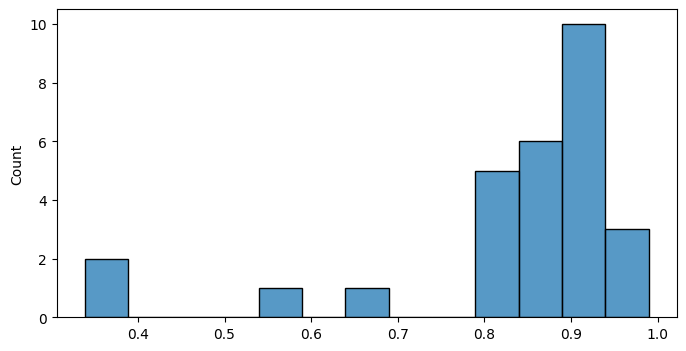

In [384]:
sns.histplot(corrsx)

In [391]:
clustering = LeidenClustering()

Trying to set attribute `.var` of view, copying.
Trying to set attribute `.obs` of view, copying.
... storing 'in_tissue' as categorical
... storing 'array_row' as categorical
... storing 'array_col' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
Trying to set attribute `.obsm` of view, copying.
Trying to set attribute `.obsm` of view, copying.
... storing 'in_tissue' as categorical
... storing 'array_row' as categorical
... storing 'array_col' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


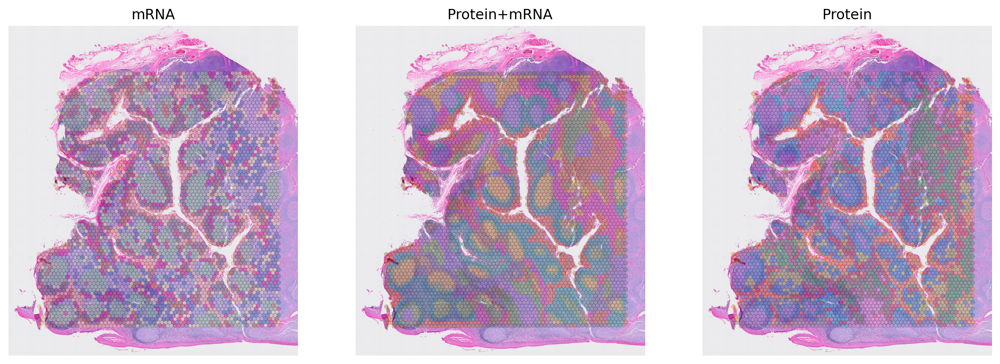

CPU times: user 29.8 s, sys: 17.9 s, total: 47.7 s
Wall time: 32.1 s


In [557]:
%%time

adata = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX')
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
adt_ref = pd.read_csv('/ix/hosmanbeyoglu/kor11/CytAssist/Brain/GEX_PEX/CytAssist_FFPE_Protein_Expression_Human_Glioblastoma_feature_reference.csv')
pdata = adata[:, [i in adt_ref[adt_ref.isotype_control==False].id.values for i in adata.var_names]]
adata = adata[:, [i not in adt_ref[adt_ref.isotype_control==False].id.values and 'MT-' not in i for i in adata.var_names]]
pdata.var.feature_types = 'Antibody Capture'

latent_gex = AnnData(gex_z)
latent_gex.obsm['spatial'] = adata.obsm['spatial']
latent_gex.uns['spatial'] = adata.uns['spatial']
sc.tl.pca(latent_gex)
sc.pp.neighbors(latent_gex)

clustering.fit(gex_z)

adata.obs['spicess'] = clustering.labels_
adata.obs['spicess'] = adata.obs['spicess'].astype('category')
pdata.obsm['spatial'] = adata.obsm['spatial']

sc.tl.pca(adata)
sc.pp.neighbors(adata)

sc.tl.pca(pdata)
sc.pp.neighbors(pdata)

resolution = 0.35 # higher = more clusters
size = 1.5
linewidth = 0.2
img = True
alpha = 0.35

sc.tl.leiden(adata, resolution=resolution)
sc.tl.leiden(pdata, resolution=resolution)
sc.tl.leiden(latent_gex, resolution=0.9)

pdata.uns['spatial'] = adata.uns['spatial']
pdata.obs['spicess'] = clustering.labels_
pdata.obs['spicess'] = pdata.obs['spicess'].astype('category')

f, axs = plt.subplots(1, 3, figsize=(15, 15), dpi=180)
axs = axs.flatten()
sq.pl.spatial_scatter(adata, color=['leiden'], size=size, edgecolor='black', linewidth=linewidth, frameon=False, ax=axs[0], title='mRNA', alpha=alpha, palette='Accent', img=img, crop_coord=tuple([0, 0, 28000, 40000]))
sq.pl.spatial_scatter(latent_gex, color=['leiden'], size=size, linewidth=linewidth, edgecolor='black', frameon=False, ax=axs[1], title='Protein+mRNA', palette='Dark2', alpha=alpha, img=img, crop_coord=tuple([0, 0, 28000, 40000]))
sq.pl.spatial_scatter(pdata, color=['leiden'], size=size, edgecolor='black', linewidth=linewidth, frameon=False, ax=axs[2], title='Protein', alpha=alpha, img=img, crop_coord=tuple([0, 0, 28000, 40000]))

axs[0].get_legend().remove()
axs[1].get_legend().remove()
axs[2].get_legend().remove()

# plt.savefig('clusters.png', format='png', dpi=200)
plt.show()

In [202]:
# plt.rcParams['figure.figsize'] = (5, 5)
# ix = 99
# sns.scatterplot(b[:, ix], a[:, ix], color='limegreen')
# plt.title(f'Gene: {adata.var_names[ix]}\nCORR: {spearmanr(b[:, ix], a[:, ix]).statistic:.3f}')
# plt.savefig('protein.svg', dpi=120, format='svg')
# plt.show()

In [539]:
modelx = SpatialVAE([d11.shape[1], d12.shape[1]], 32).cuda()
modelx.eval()
outputx =  modelx(X=[d11, d12], A=gex.adj_norm, corr=corr)
gex_z = integrated_data.gex_z.data.cpu().numpy()
pex_z = integrated_data.pex_z.data.cpu().numpy()

ax = outputx.gex_recons.data.cpu().numpy()
bx = gex.features_pca.data.cpu().numpy()
cx = outputx.pex_recons.data.cpu().numpy()
dx = pex.features_pca.data.cpu().numpy()

In [540]:
corrs = []
for ixs in range(b.shape[1]):
    corrs.append(spearmanr(b[:, ixs], a[:, ixs]).statistic)    
sns.histplot(corrs, color='red', alpha=0.5, label='TrainedModel')
corrs = []
for ixs in range(bx.shape[1]):
    corrs.append(spearmanr(bx[:, ixs], ax[:, ixs]).statistic)    
sns.histplot(corrs, color='blue', alpha=0.5, label='NullModel')
plt.title('Gene Expression Correlation')
plt.xlabel('Spearmanr')
plt.xlim(-0.35, 1.0)
plt.tight_layout()
plt.legend()
plt.savefig('perf_gex.svg', format='svg', dpi=300)
plt.show()

corrs = []
for ixs in range(d.shape[1]):
    corrs.append(spearmanr(d[:, ixs], c[:, ixs]).statistic)    
sns.histplot(corrs, color='red', alpha=0.5, label='TrainedModel')
corrs = []
for ixs in range(dx.shape[1]):
    corrs.append(spearmanr(dx[:, ixs], cx[:, ixs]).statistic)    
sns.histplot(corrs, color='blue', alpha=0.5, label='NullModel')
plt.title('Protein Expression Correlation')
plt.xlabel('Spearmanr')
plt.xlim(-0.35, 1.0)
plt.tight_layout()
plt.legend()
plt.savefig('perf_pex.svg', format='svg', dpi=300)
plt.show()

IndexError: index 196 is out of bounds for axis 1 with size 196